#### PASCAL-VOC ------ dataloader 
- only image and its bounding boxes _ load by the test folder 
- however, the annotations folder of the test folder has less items than the image folder
- so the function loads annotations first, then load the images later.

In [1]:
import os
import torch
from torch.utils.data import Dataset
from PIL import Image
import xml.etree.ElementTree as ET

class customPASCALdataset (Dataset):
    # consider the root_dir = train_val; since the structure of the test folder and train_val folder nearly the same and are gathered to become pascal-voc
    def __init__ (self, root_dir, transforms = None):
        self.root_dir = root_dir
        self.transforms = transforms
        self.image_dir = os.path.join(root_dir, 'JPEGImages')
        self.annotation_dir = os.path.join(root_dir, 'Annotations')
        self.image_list = os.listdir(self.image_dir)
        self.annotation_list = os.listdir(self.annotation_dir)
        


    def __len__(self):
        return len(self.annotation_list)

# test folder
    def __getitem__(self, index):
        img_name_anno = self.annotation_list[index]
        annotation_path = os.path.join(self.annotation_dir, img_name_anno)
        img_path = os.path.join(self.image_dir, img_name_anno.replace('.xml','.jpg'))

        image = Image.open(img_path).convert('RGB')
        label = self.parse_annotation(annotation_path)
              
        return image, label

    def parse_annotation(self, annotation_path):
        tree = ET.parse(annotation_path)
        root = tree.getroot()

        objects = []
        for obj in root.findall('object'):
            name = obj.find('name').text
            bbox = obj.find('bndbox')
            xmin = int(bbox.find('xmin').text)
            ymin = int(bbox.find('ymin').text)
            xmax = int(bbox.find('xmax').text)
            ymax = int(bbox.find('ymax').text)
            objects.append({
                'name': name,
                'bbox': [xmin, ymin, xmax, ymax]
            })

        return objects


### Visualize image

In [8]:
import matplotlib.pyplot as plt

def visualize_data(dataset):
    num_images = 10#
    fig, axes = plt.subplots(nrows=num_images, ncols=2, figsize=(6, 6 * num_images))

    for i in range(num_images):
        image, label = dataset[i]
        print (image,label)

        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(f"Image {i+1}")

        # You can customize the visualization of the target here
        # For example, plotting bounding boxes or labels

    plt.tight_layout()
    plt.show()

### Visualize bbox & image

In [10]:
import matplotlib.pyplot as plt

def visualize_data(dataset):
    num_images = 10
    fig, axes = plt.subplots(nrows=num_images, ncols=1, figsize=(6, 6 * num_images))

    for i in range(num_images):
        image, target = dataset[i]

        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(f"Image {i+1}")

        # Plot bounding boxes
        for obj in target:
            bbox = obj['bbox']
            xmin, ymin, xmax, ymax = bbox

            # Plot bounding box rectangle
            rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                 fill=False, edgecolor='r', linewidth=2)
            axes[i].add_patch(rect)

            # Add label text
            label = obj['name']
            axes[i].text(xmin, ymin - 2, label, fontsize=8, color='r',
                         bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

    plt.tight_layout()
    plt.show()


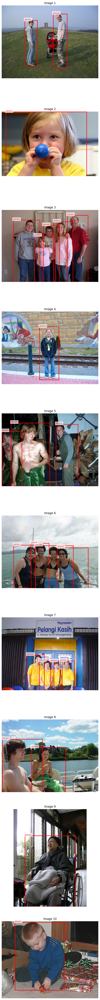

In [11]:
root_dir = 'D:\TorchProject\dataset\pascal-voc\VOC2012_test'
dataset = customPASCALdataset(root_dir, transforms=None)
#data_loader = DataLoader(dataset, batch_size=32, shuffle=True)
visualize_data(dataset)

### PASCAL VOC 2012 ###
- Load data with segmentation masks
- because the numbers of files in the Segmentation folder is different from JPEGImage folder

In [1]:
import os
import torch
from torch.utils.data import Dataset
from PIL import Image
import xml.etree.ElementTree as ET

class customPASCALdataset (Dataset):
    # consider the root_dir = train_val; since the structure of the test folder and train_val folder nearly the same and are gathered to become pascal-voc
    def __init__ (self, root_dir, transforms = None):
        self.root_dir = root_dir
        self.transforms = transforms

        self.image_dir = os.path.join(root_dir, 'JPEGImages')
        self.mask_dir = os.path.join(root_dir, 'SegmentationObject')     

        self.image_list = os.listdir(self.image_dir)
        self.mask_segment = os.listdir(self.mask_dir)

    def __len__(self):
        return len(self.mask_segment)

# test folder
    def __getitem__(self, index):
        img_name_mask = self.mask_segment[index]
        img_path = os.path.join(self.image_dir, img_name_mask.replace('.png','.jpg'))
        image = Image.open(img_path).convert('RGB')

        mask_path = os.path.join(self.mask_dir, img_name_mask)
        mask = Image.open(mask_path).convert('RGB')
              
        return image, mask

In [2]:
import matplotlib.pyplot as plt

def visualize_data(dataset):
    num_images = 10
    fig, axes = plt.subplots(nrows=num_images, ncols=1, figsize=(6, 6 * num_images))

    for i in range(num_images):
        image, mask = dataset[i]

        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(f"Image {i+1}")

        # Plot bounding boxes
        axes[i].imshow(mask, cmap='jet', alpha=0.5)

    plt.tight_layout()
    plt.show()


### Visualize the segmentation mask 

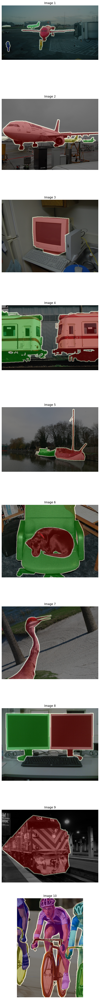

In [3]:
root_dir = 'D:\TorchProject\dataset\pascal-voc\VOC2012_train_val'
dataset = customPASCALdataset(root_dir)

visualize_data(dataset)